# Outline

1. Install libraries
2. Process the video/webcam feed to get the frames
3. Extract the landmarks from the frames
4. Visualize the landmarks


## 1. Install libraries

In [1]:
! pip install mediapipe opencv-python

     -------------------------------------- 51.0/51.0 MB 966.6 kB/s eta 0:00:00
     ---------------------------------------- 38.8/38.8 MB 1.0 MB/s eta 0:00:00
     ------------------------------------ 363.6/363.6 kB 594.9 kB/s eta 0:00:00
  Using cached absl_py-2.1.0-py3-none-any.whl (133 kB)
     -------------------------------------- 64.2/64.2 MB 815.2 kB/s eta 0:00:00
     ---------------------------------------- 45.5/45.5 MB 1.0 MB/s eta 0:00:00
     ------------------------------------ 413.4/413.4 kB 678.8 kB/s eta 0:00:00
     ---------------------------------------- 2.2/2.2 MB 943.5 kB/s eta 0:00:00
     -------------------------------------- 71.9/71.9 kB 979.2 kB/s eta 0:00:00
     -------------------------------------- 15.8/15.8 MB 874.0 kB/s eta 0:00:00
     -------------------------------------- 211.9/211.9 kB 1.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.1
    Uninstalling protobuf-4.25.1:
      Successfully uninstalle

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.26.4 which is incompatible.


In [4]:
! pip install wget

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9680 sha256=6f179cc96f9e8801605bc9d116f0ae8c11a7a020f3c00274c864ebc679c794a3
  Stored in directory: c:\users\swapn\appdata\local\pip\cache\wheels\46\78\0e\8e5e2b500f83a682c8d7e7ce820638cf99faa894a662f71cf0
Successfully built wget


In [8]:
!wget -O pose_landmarker.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_heavy/float16/1/pose_landmarker_heavy.task

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [9]:
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np

ImportError: DLL load failed while importing _framework_bindings: A dynamic link library (DLL) initialization routine failed.

In [17]:
import os
import cv2

In [103]:
# Define video paths and frame paths
VIDEO_PATH = r'D:\Get_Fit_with_PCA\IMG_8663.MOV'

# Define the path where you want to store the frames from the video
OUTPUT_DIR = r'D:\Get_Fit_with_PCA\frames' 

# Define the number of frames interval
FRAME_INTERVAL = 10

In [104]:
# Ensure output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Initialize video capture
video_capture = cv2.VideoCapture(VIDEO_PATH)
if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file: {VIDEO_PATH}")

frame_count = 0
extracted_count = 0

while True:
    success, frame = video_capture.read()
    if not success:
        break  # Exit loop if no more frames are available

    # Save every FRAME_INTERVAL-th frame
    if frame_count % FRAME_INTERVAL == 0:
        frame_filename = os.path.join(OUTPUT_DIR, f"frame_{frame_count:04d}.jpg")
        cv2.imwrite(frame_filename, frame)
        extracted_count += 1

    frame_count += 1

# Release resources
video_capture.release()

print(f"Total frames processed: {frame_count}")
print(f"Total frames extracted: {extracted_count}")

Total frames processed: 907
Total frames extracted: 91


In [23]:
import mediapipe as mp


In [22]:
!pip install mediapipe==0.10.5

     -------------------------------------- 50.3/50.3 MB 659.2 kB/s eta 0:00:00
     -------------------------------------- 904.0/904.0 kB 2.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
  Attempting uninstall: mediapipe
    Found existing installation: mediapipe 0.10.20
    Uninstalling mediapipe-0.10.20:
      Successfully uninstalled mediapipe-0.10.20


In [24]:
#@markdown To better demonstrate the Pose Landmarker API, we have created a set of visualization tools that will be used in this colab. These will draw the landmarks on a detect person, as well as the expected connections between those markers.

from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np


def draw_landmarks_on_image(rgb_image, detection_result):
  pose_landmarks_list = detection_result.pose_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected poses to visualize.
  for idx in range(len(pose_landmarks_list)):
    pose_landmarks = pose_landmarks_list[idx]

    # Draw the pose landmarks.
    pose_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    pose_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in pose_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      pose_landmarks_proto,
      solutions.pose.POSE_CONNECTIONS,
      solutions.drawing_styles.get_default_pose_landmarks_style())
  return annotated_image

In [26]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

In [48]:
# STEP 2: Create an PoseLandmarker object.
base_options = python.BaseOptions(model_asset_path='pose_landmarker_heavy.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    output_segmentation_masks=True)
detector = vision.PoseLandmarker.create_from_options(options)

In [49]:
# STEP 3: Load the input image.
image = mp.Image.create_from_file("test_img.jpg")

# STEP 4: Detect pose landmarks from the input image.
detection_result = detector.detect(image)

# STEP 5: Process the detection result. In this case, visualize it.
annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result)

# Display the image using matplotlib
import matplotlib.pyplot as plt

plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
plt.axis('off')  # Hide axes
plt.show()

RuntimeError: Image decoding failed (can't fopen): test_img.jpg

In [71]:
# from mediapipe_landmark_detection import PoseLandmarkExtractor

In [97]:
def process_frames_and_extract_landmarks(frames_dir, model_path='pose_landmarker_heavy.task'):
    """
    Processes all frames in the specified directory and extracts landmarks.

    Args:
        frames_dir (str): Path to the directory containing frames.
        model_path (str): Path to the MediaPipe model file.

    Returns:
        list: A list of annotated frames with pose landmarks.
    """
    
    # Creating an instance of PoseLandmarkExtractor
    extractor = PoseLandmarkExtractor(model_path=model_path)
    annotated_frames = []
    extracted_landmarks = []

    for frame_file in sorted(os.listdir(frames_dir)):
        frame_path = os.path.join(frames_dir, frame_file)
        if not frame_file.lower().endswith(('.jpg', '.png')):
            continue  

        result = extractor.detect_landmarks(frame_path)
        # annotated_frames.append(result["annotated_image"])

        extractor.display_image(result["annotated_image"], title=f"Annotated {frame_file}")
        extracted_landmarks.append(result['selected_landmarks'])

    return extracted_landmarks

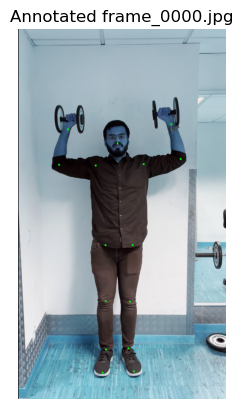

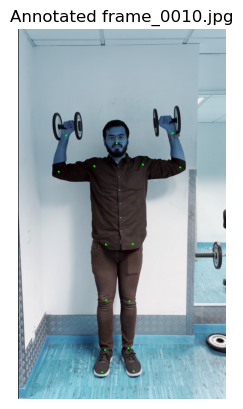

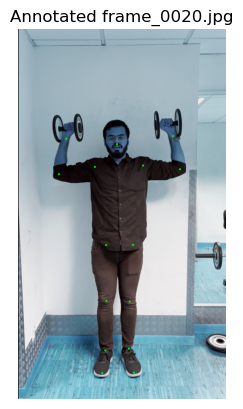

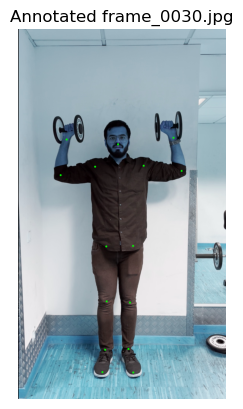

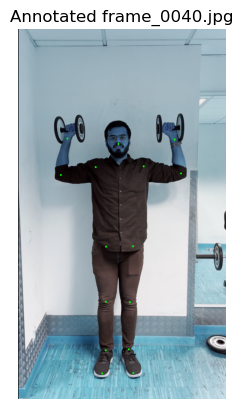

...

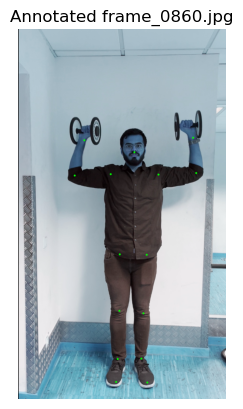

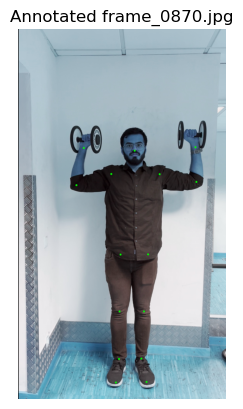

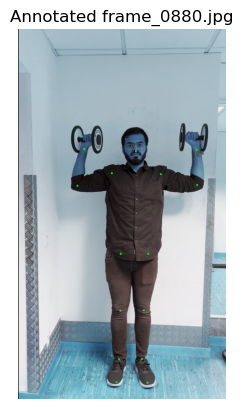

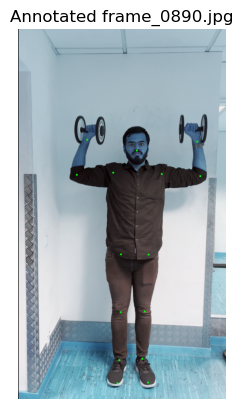

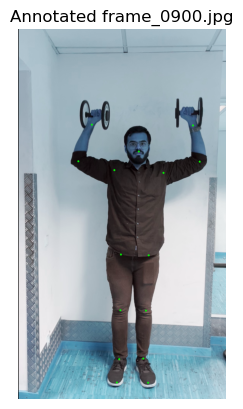

In [105]:
FRAMES_DIR = r"D:\Get_Fit_with_PCA\frames"
MODEL_PATH = r"pose_landmarker_heavy.task"

# Process frames and extract landmarks
extracted_landmarks = process_frames_and_extract_landmarks(FRAMES_DIR, MODEL_PATH)



In [106]:
print(len(extracted_landmarks))

91


In [107]:
import pickle

In [96]:
import cv2
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from mediapipe.framework.formats import landmark_pb2
import numpy as np
import matplotlib.pyplot as plt
import os

class PoseLandmarkExtractor:
    def __init__(self, model_path='pose_landmarker_heavy.task'):
        """
        Initializes the PoseLandmarkExtractor with the specified model.
        """
        self.base_options = python.BaseOptions(model_asset_path=model_path)
        self.options = vision.PoseLandmarkerOptions(
            base_options=self.base_options,
            output_segmentation_masks=True
        )
        self.detector = vision.PoseLandmarker.create_from_options(self.options)
        self.drawing_utils = mp.solutions.drawing_utils
        self.pose_connections = mp.solutions.pose.POSE_CONNECTIONS
        self.landmark_style = mp.solutions.drawing_styles.get_default_pose_landmarks_style()

    def detect_landmarks(self, image_path):
        """
        Detects pose landmarks in the given image and keeps specific indices.

        Args:
            image_path (str): Path to the input image.

        Returns:
            dict: A dictionary containing the selected pose landmarks (x, y) and the annotated image.
        """
        # Indices of landmarks to keep
        selected_indices = [0, 11, 12, 13, 14, 15, 16, 24, 23, 25, 26, 27, 28, 31, 32]
        
        # Load the image
        mp_image = mp.Image.create_from_file(image_path)
        
        # Detect pose landmarks
        detection_result = self.detector.detect(mp_image)
        
        # Extract pose landmarks
        landmarks = detection_result.pose_landmarks
        if landmarks:
            # Flatten landmarks to (x, y) for selected indices
            selected_landmarks = [
                (landmarks[0][index].x, landmarks[0][index].y) 
                for index in selected_indices
            ]
        else:
            selected_landmarks = []
        
        # Annotate image with selected landmarks
        annotated_image = self._draw_landmarks_on_image(
            mp_image.numpy_view(), detection_result, selected_indices
        )
        # print(f"selected landmarks : {selected_landmarks}")
        return {
            "selected_landmarks": selected_landmarks,
            "annotated_image": annotated_image
        }

    def _draw_landmarks_on_image(self, image, detection_result, selected_indices=None):
        """
        Draws pose landmarks on the image with selected indices.

        Args:
            image (np.ndarray): Input image.
            detection_result: Detection result containing landmarks.
            selected_indices (list): List of landmark indices to draw.

        Returns:
            np.ndarray: Annotated image with selected landmarks.
        """
        annotated_image = image.copy()

        # Use selected indices to draw landmarks
        if selected_indices and detection_result.pose_landmarks:
            for index in selected_indices:
                landmark = detection_result.pose_landmarks[0][index]
                x, y = int(landmark.x * image.shape[1]), int(landmark.y * image.shape[0])
                cv2.circle(annotated_image, (x, y), radius=5, color=(0, 255, 0), thickness=-1)

        return annotated_image

    def display_image(self, image, title="Pose Landmarks"):
        """
        Displays the given image using matplotlib.

        Args:
            image (np.ndarray): The image to display.
            title (str): Title for the image.
        """
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        plt.axis('off')
        plt.title(title)
        plt.show()

In [108]:
with open('extracted_landmarks.pkl', 'wb') as f:
  pickle.dump(extracted_landmarks, f)

In [109]:
extracted_landmarks = []

with open('D:\Get_Fit_with_PCA\extracted_landmarks.pkl', 'rb') as f:
  extracted_landmarks = pickle.load(f)

In [110]:
extracted_landmarks

[[(0.47844526171684265, 0.3093603849411011),
  (0.6041085720062256, 0.3654649555683136),
  (0.3732609748840332, 0.36926478147506714),
  (0.7819351553916931, 0.3515290319919586),
  (0.1973699927330017, 0.36671677231788635),
  (0.7362092733383179, 0.25729483366012573),
  (0.24026325345039368, 0.2709958553314209),
  (0.421213299036026, 0.5839110612869263),
  (0.5516310334205627, 0.5840189456939697),
  (0.5383826494216919, 0.7370825409889221),
  (0.4216841459274292, 0.7356579303741455),
  (0.5311108827590942, 0.8632971048355103),
  (0.4227129817008972, 0.8661879897117615),
  (0.5567770600318909, 0.9252794981002808),
  (0.4070437550544739, 0.9287667274475098)],
 [(0.4747747480869293, 0.30894869565963745),
  (0.6000074744224548, 0.36641383171081543),
  (0.36758121848106384, 0.37078776955604553),
  (0.7799029350280762, 0.37431231141090393),
  (0.19555053114891052, 0.3857713043689728),
  (0.7433141469955444, 0.28139135241508484),
  (0.23191943764686584, 0.28760024905204773),
  (0.4225608110427